<a href="https://colab.research.google.com/github/MikaTan2007/Algoverse/blob/main/notebooks/pixart-sigma/base/linear_probe/pixart-sigma_heatmaps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Project Setup

In [1]:
%pip install -U diffusers  # ensure it's >= 0.28.0
%pip install transformers accelerate safetensors sentencepiece
%pip install ftfy

import torch
from diffusers import PixArtSigmaPipeline
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
!pip install git+https://{token}@github.com/AmnaJamalKhattak/Antonio-acwk.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.0 MB/s eta 0:00:00
  Cloning https://****@github.com/AmnaJamalKhattak/Antonio-acwk.git to /tmp/pip-req-build-sd1ggysx
  Running command git clone --filter=blob:none --quiet 'https://****@github.com/AmnaJamalKhattak/Antonio-acwk.git' /tmp/pip-req-build-sd1ggysx
  fatal: could not read Password for 'https://%7Btoken%7D@github.com': No such device or address
  error: subprocess-exited-with-error
  
  × git clone --filter=blob:none --quiet 'https://****@github.com/AmnaJamalKhattak/Antonio-acwk.git' /tmp/pip-req-build-sd1ggysx did not run successfully.
  │ exit code: 128
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git clone --filter=blob:none --quiet 'https://****@github.com/AmnaJamalKhattak/Antonio-acwk.git' /tmp/pip-req-build-sd1ggysx did not run successfully.
│ exit code: 128
╰─> See above for output.

note: This error

### Pipe

In [2]:
def get_device():
  if torch.cuda.is_available():
    return "cuda"
  elif torch.backends.mps.is_available():
    return "mps"
  else:
    return "cpu"

device = get_device()

weight_dtype = torch.float16  # Use 16-bit weights for efficiency

pipe = PixArtSigmaPipeline.from_pretrained(
    "PixArt-alpha/PixArt-Sigma-XL-2-1024-MS",
    torch_dtype=weight_dtype,
    use_safetensors=True,
)
pipe.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/400 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/655 [00:00<?, ?B/s]

text_encoder/model-00001-of-00002.safete(…):   0%|          | 0.00/9.99G [00:00<?, ?B/s]

text_encoder/model-00002-of-00002.safete(…):   0%|          | 0.00/9.06G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/785 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

tokenizer/spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

transformer/diffusion_pytorch_model.safe(…):   0%|          | 0.00/2.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


PixArtSigmaPipeline {
  "_class_name": "PixArtSigmaPipeline",
  "_diffusers_version": "0.35.1",
  "_name_or_path": "PixArt-alpha/PixArt-Sigma-XL-2-1024-MS",
  "scheduler": [
    "diffusers",
    "DPMSolverMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "T5Tokenizer"
  ],
  "transformer": [
    "diffusers",
    "PixArtTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

### Capturing Norms

In [3]:
# Global Storage
layer_norms = defaultdict(lambda: defaultdict(list))
layer_norms_2 = defaultdict(lambda: defaultdict(list))
layer_norms_3 = defaultdict(lambda: defaultdict(list))
current_timestep = 0

# Define a regular function for the inner defaultdict
def list_default():
    return defaultdict(list)

# Hook Function
def hook_img_norms(layer_idx):
    def hook(module, input, output):
        if isinstance(output, torch.Tensor):
            # Store the raw activation tensor
            activations = output.detach().cpu()  # (B, seq_len, hidden_dim)
            #print(img_activations.shape) torch.Size([2, 4096, 1152])

            #Compute L2 norms across hidden dim to get a single scalar per patch
            norms = torch.linalg.norm(activations[0], dim = 1) #shape = [4096]
            norms2 = torch.linalg.norm(activations[1], dim = 1) #shape = [4096]
            norms3 = torch.linalg.norm(activations, dim = -1)
            layer_norms[layer_idx][current_timestep] = norms
            layer_norms_2[layer_idx][current_timestep] = norms2
            layer_norms_3[layer_idx][current_timestep] = norms3
            del norms, norms2, norms3

            # if current_timestep not in layer_norms[layer_idx]:
            #     layer_norms[layer_idx][current_timestep] = norms
            # else:
            #     # Concatenate with existing tensor along batch dimension
            #     layer_norms[layer_idx][current_timestep] = torch.cat(
            #         [layer_norms[layer_idx][current_timestep], norms], dim=0
            #     )

    return hook

#Register Hooks
def register_hooks(pipe):
    handles = []
    for i, block in enumerate(pipe.transformer.transformer_blocks):
        handles.append(block.register_forward_hook(hook_img_norms(i)))
    return handles

def generate_img_norms(pipe, prompt, num_inference_steps=10):
    global current_timestep
    layer_norms.clear()

    # Register hooks
    handles = register_hooks(pipe)

    # Run diffusion loop (hooks fire automatically)
    for t_idx, t in enumerate(pipe.scheduler.timesteps[:num_inference_steps]):
        current_timestep = int(t)
        _ = pipe(
            prompt,
            num_inference_steps=num_inference_steps,
            output_type="latent",
        )

    # Remove hooks
    for h in handles:
        h.remove()

    return layer_norms
    return layer_norms_2
    return layer_norms_3

In [4]:
prompt = "An aerial view showing a airplane in formation over the ocean, in a city, docked, during golden hour"
generate_img_norms(pipe, prompt, num_inference_steps=10)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

defaultdict(<function __main__.<lambda>()>,
            {0: defaultdict(list,
                         {999: tensor([41.1562, 41.4062, 41.5938,  ..., 41.3125, 41.1875, 41.3438],
                                 dtype=torch.float16),
                          998: tensor([40.9062, 40.8750, 41.0000,  ..., 41.5938, 41.3438, 41.3750],
                                 dtype=torch.float16),
                          997: tensor([40.6562, 40.6875, 40.9375,  ..., 41.1562, 41.3125, 41.2500],
                                 dtype=torch.float16),
                          996: tensor([40.6875, 40.7812, 41.0000,  ..., 41.5000, 41.4688, 41.3750],
                                 dtype=torch.float16),
                          995: tensor([40.8438, 40.9375, 41.0625,  ..., 41.3125, 41.3750, 41.5000],
                                 dtype=torch.float16),
                          994: tensor([40.7500, 40.7188, 40.9688,  ..., 41.3125, 41.2500, 41.3750],
                                 dtype=torch.fl

### Plotting

In [5]:
import matplotlib.pyplot as plt
import math

def plot_heatmap(norms, title=None):
    # norms: [4096] for PixArt-Sigma
    L = norms.shape[0]
    H = int(math.sqrt(L))       # should be 64
    W = L // H                  # also 64
    spatial = norms.reshape(H, W)

    plt.figure(figsize=(6,6))
    plt.imshow(spatial, cmap='inferno')
    plt.colorbar(label='L2 Norm')
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

### Layer Norms 1

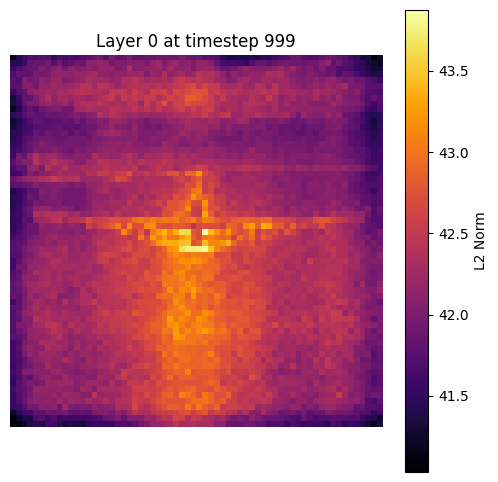

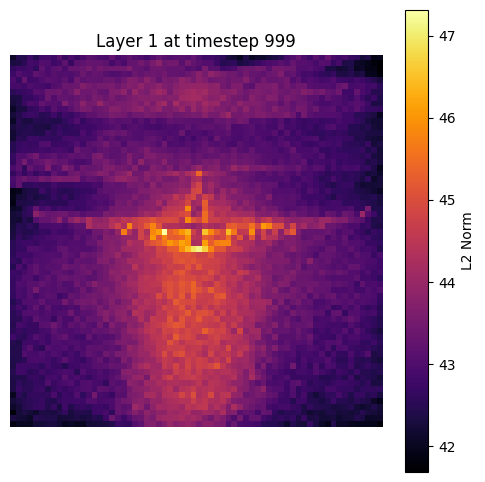

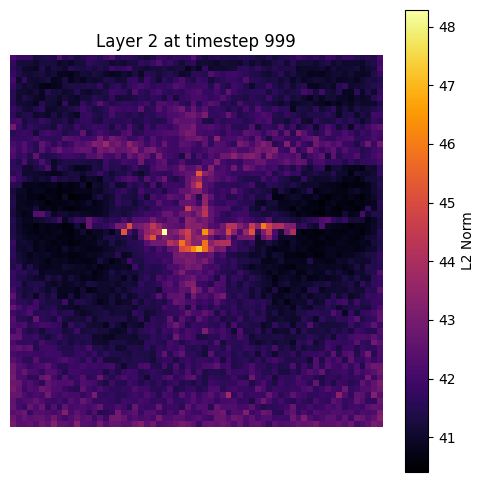

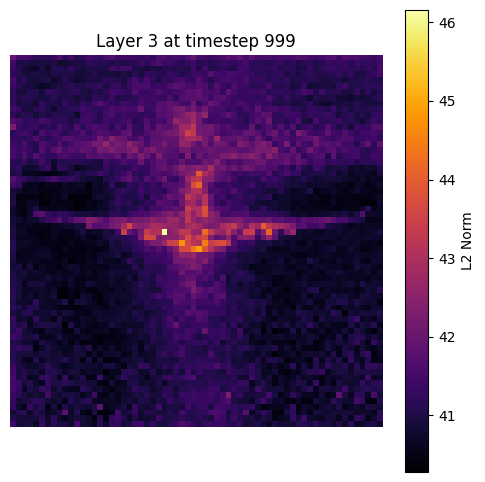

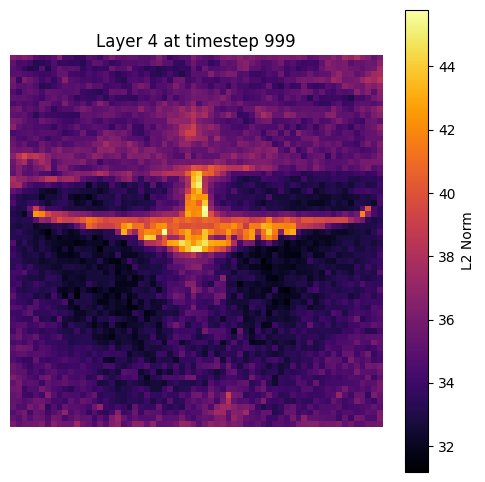

...

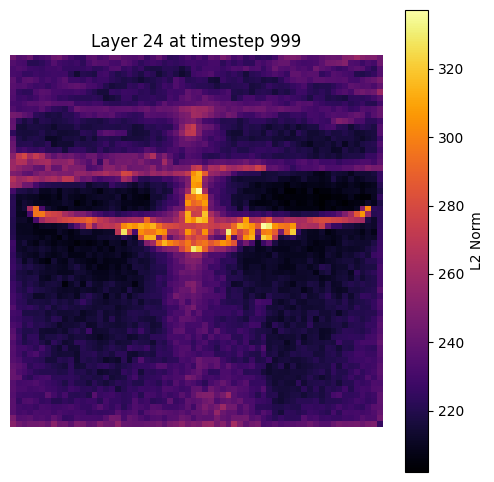

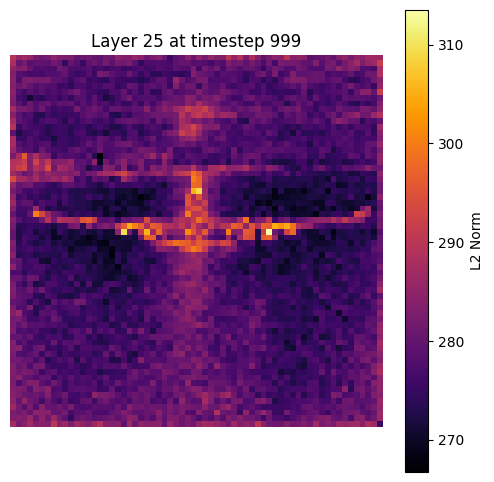

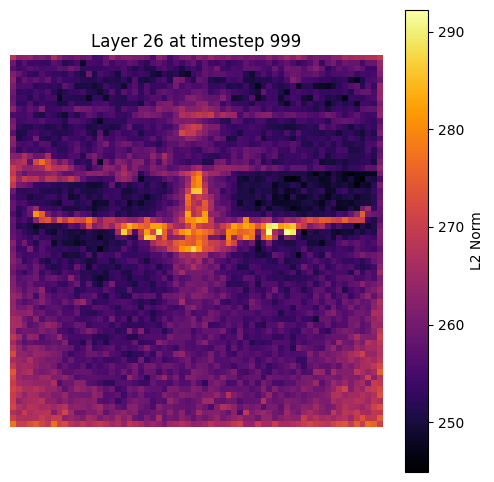

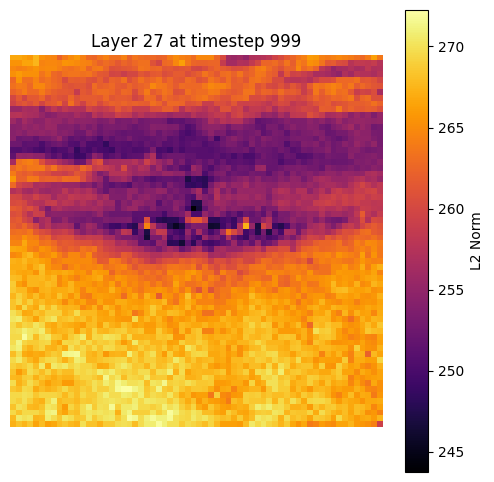

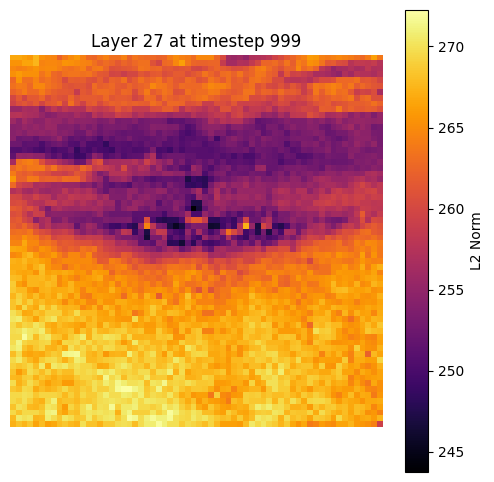

In [6]:
# Pick one layer & timestep to visualize
for layer_id in range (0, 28):
    timestep = list(layer_norms[layer_id].keys())[0]
    norms = layer_norms[layer_id][timestep]

    plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")

plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")


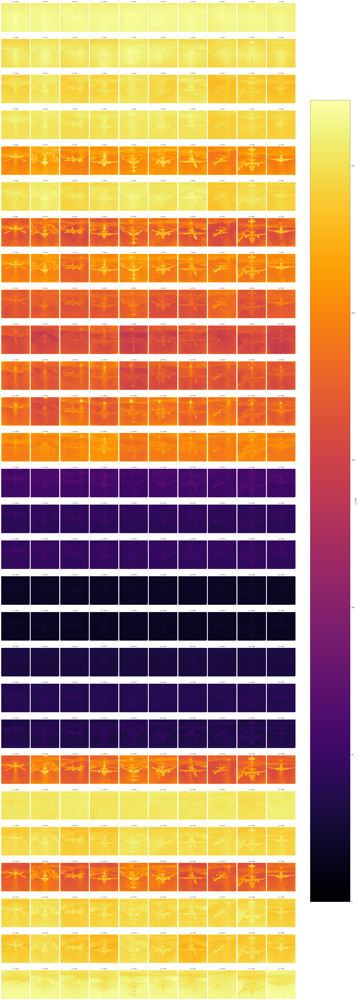

In [7]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms.keys())   # which layers to plot

# Determine grid size
n_rows = len(layer_ids)
n_cols = max(len(layer_norms[l]) for l in layer_ids)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

if n_rows == 1:
    axes = axes[None, :]   # make it 2D
if n_cols == 1:
    axes = axes[:, None]   # make it 2D

# Loop through layers and timesteps
for row_idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms[layer_id].keys())
    for col_idx, timestep in enumerate(timesteps):
        norms = layer_norms[layer_id][timestep]
        L = norms.shape[0]
        H = int(math.sqrt(L))
        W = L // H
        spatial = norms.reshape(H, W)

        ax = axes[row_idx, col_idx]
        im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
        ax.set_title(f"L{layer_id} T{timestep}", fontsize=8)
        ax.axis('off')

# Add a single colorbar for the entire figure
fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8, label='L2 Norm')
plt.show()


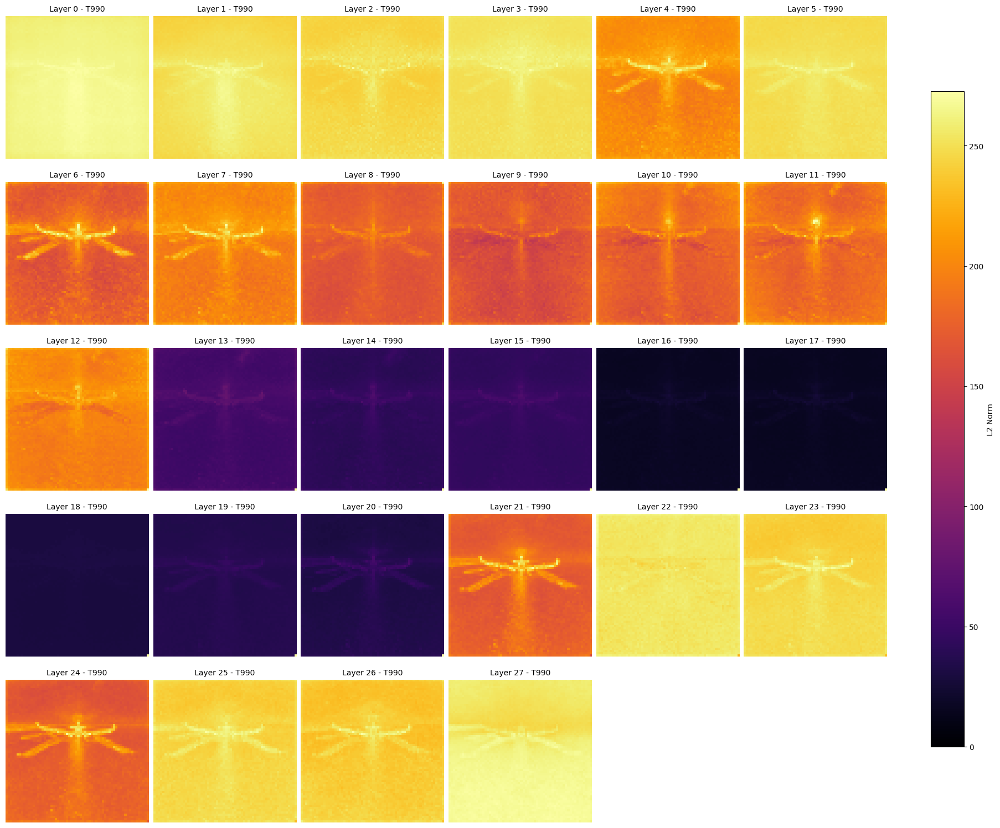

In [8]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms.keys())  # layers to plot
n_layers = len(layer_ids)

# Compute grid size (rows x cols) to make it roughly square
n_cols = math.ceil(math.sqrt(n_layers))
n_rows = math.ceil(n_layers / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms[layer_id].keys())
    if len(timesteps) == 0:
        axes[idx].set_visible(False)
        continue
    timestep = timesteps[0]  # first timestep only

    norms = layer_norms[layer_id][timestep]
    L = norms.shape[0]
    H = int(math.sqrt(L))
    W = L // H
    spatial = norms.reshape(H, W)

    ax = axes[idx]
    im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
    ax.set_title(f"Layer {layer_id} - T{timestep}", fontsize=10)
    ax.axis('off')

# Hide any unused axes
for ax in axes[n_layers:]:
    ax.set_visible(False)

# Add a single colorbar for all heatmaps
fig.colorbar(im, ax=axes[:n_layers], shrink=0.8, label='L2 Norm')
plt.show()


### Layer Norms 2

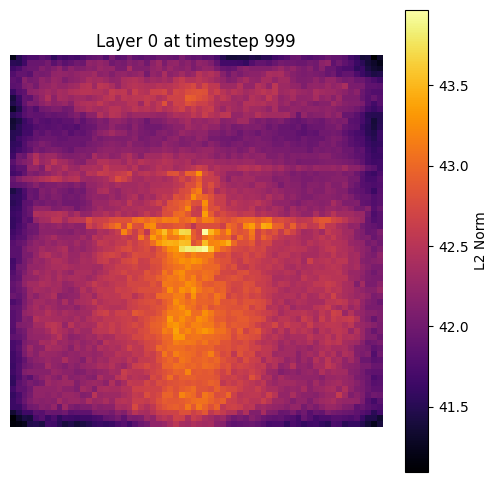

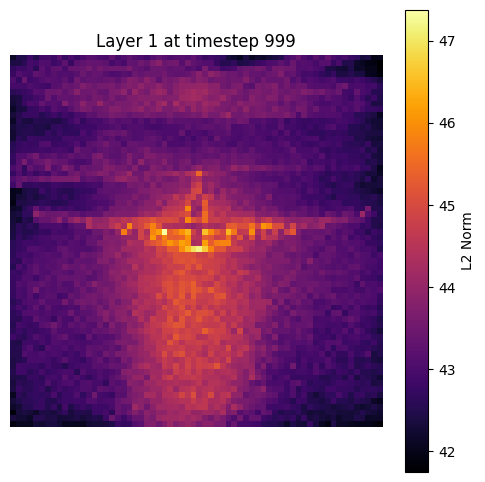

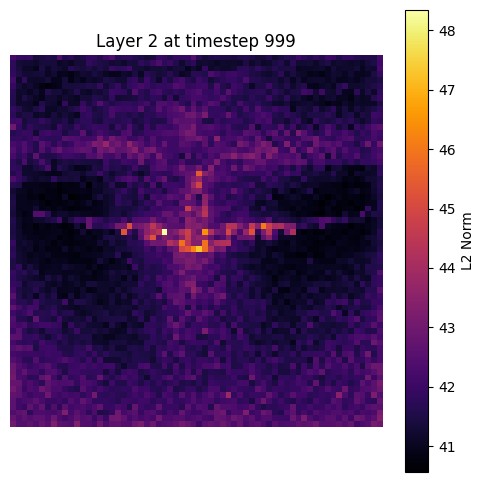

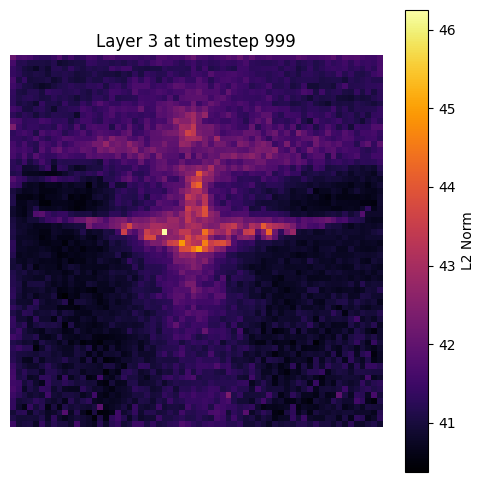

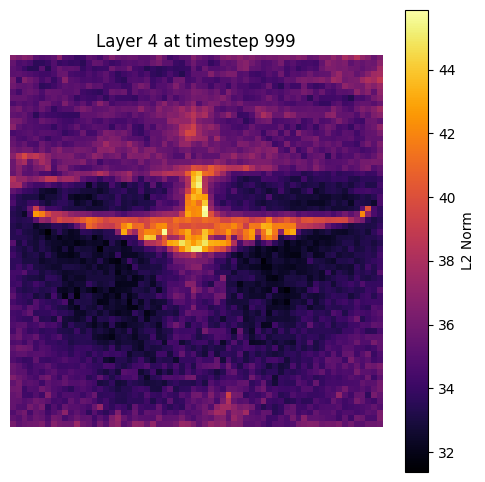

...

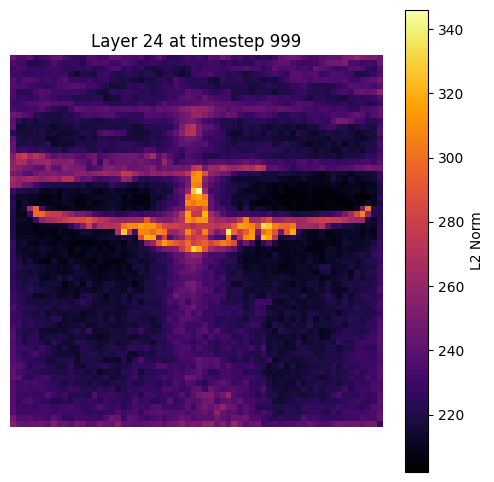

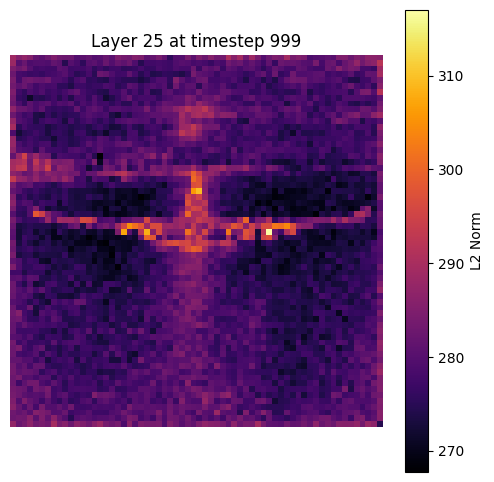

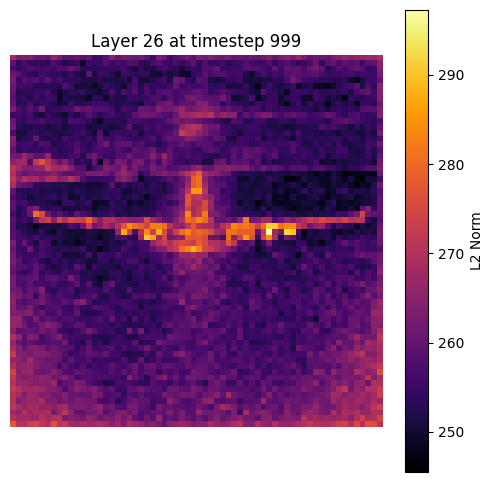

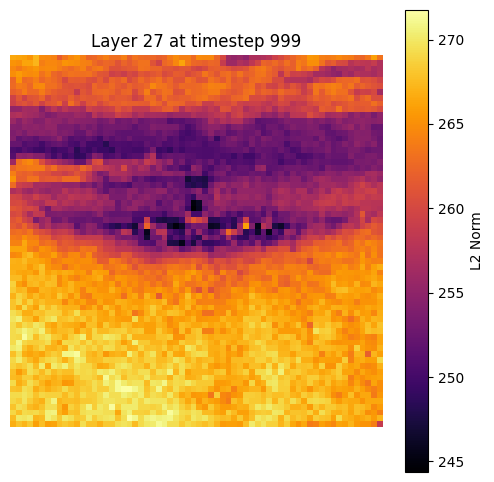

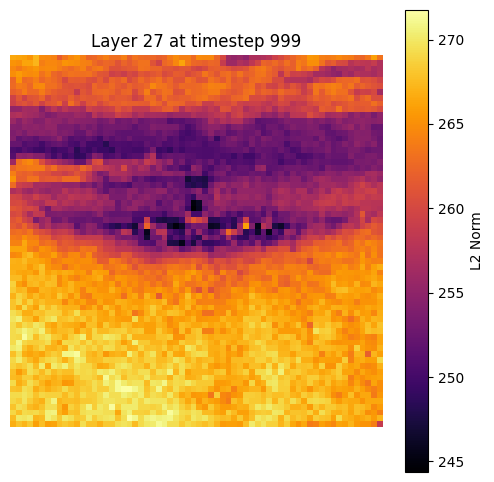

In [9]:
# Pick one layer & timestep to visualize
for layer_id in range (0, 28):
    timestep = list(layer_norms_2[layer_id].keys())[0]
    norms = layer_norms_2[layer_id][timestep]

    plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")

plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")

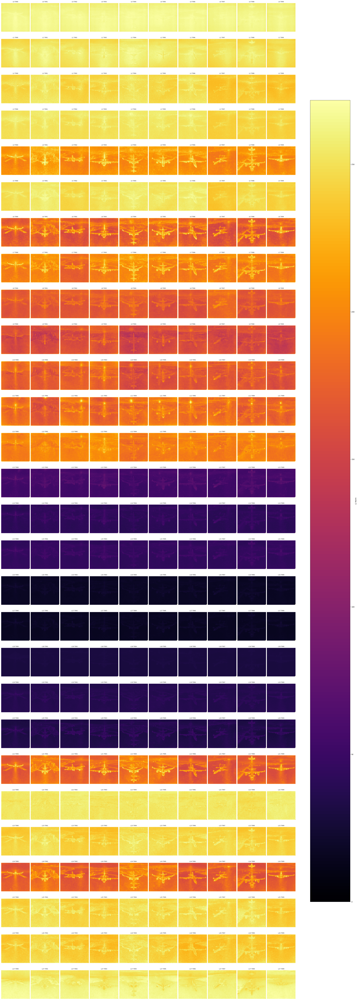

In [10]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms_2.keys())   # which layers to plot

# Determine grid size
n_rows = len(layer_ids)
n_cols = max(len(layer_norms_2[l]) for l in layer_ids)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

if n_rows == 1:
    axes = axes[None, :]   # make it 2D
if n_cols == 1:
    axes = axes[:, None]   # make it 2D

# Loop through layers and timesteps
for row_idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms_2[layer_id].keys())
    for col_idx, timestep in enumerate(timesteps):
        norms = layer_norms_2[layer_id][timestep]
        L = norms.shape[0]
        H = int(math.sqrt(L))
        W = L // H
        spatial = norms.reshape(H, W)

        ax = axes[row_idx, col_idx]
        im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
        ax.set_title(f"L{layer_id} T{timestep}", fontsize=8)
        ax.axis('off')

# Add a single colorbar for the entire figure
fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8, label='L2 Norm')
plt.show()

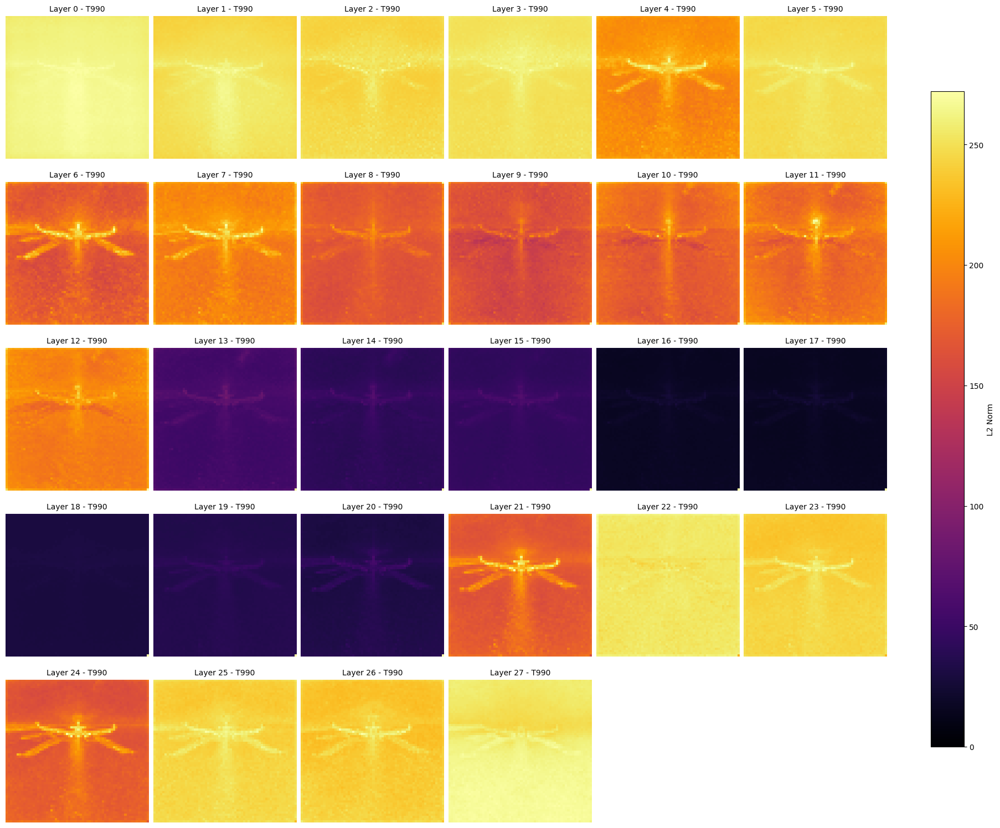

In [11]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms_2.keys())  # layers to plot
n_layers = len(layer_ids)

# Compute grid size (rows x cols) to make it roughly square
n_cols = math.ceil(math.sqrt(n_layers))
n_rows = math.ceil(n_layers / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms_2[layer_id].keys())
    if len(timesteps) == 0:
        axes[idx].set_visible(False)
        continue
    timestep = timesteps[0]  # first timestep only

    norms = layer_norms_2[layer_id][timestep]
    L = norms.shape[0]
    H = int(math.sqrt(L))
    W = L // H
    spatial = norms.reshape(H, W)

    ax = axes[idx]
    im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
    ax.set_title(f"Layer {layer_id} - T{timestep}", fontsize=10)
    ax.axis('off')

# Hide any unused axes
for ax in axes[n_layers:]:
    ax.set_visible(False)

# Add a single colorbar for all heatmaps
fig.colorbar(im, ax=axes[:n_layers], shrink=0.8, label='L2 Norm')
plt.show()


### Layer Norms 3

In [21]:
def plot_heatmap(norms, title=""):
    # Convert list to a single tensor
    if isinstance(norms, list):
        norms = torch.stack(norms)       # shape (B, seq_len)

    # If batch dimension present, pick conditional branch
    if norms.ndim == 2:
        norms = norms[1]                  # shape (seq_len,)

    L = norms.shape[0]
    H = int(math.sqrt(L))
    W = L // H

    spatial = norms.reshape(H, W)

    plt.figure(figsize=(6,6))
    plt.imshow(spatial, cmap="inferno")
    plt.colorbar(label="L2 norm")
    plt.title(title)
    plt.axis("off")
    plt.show()

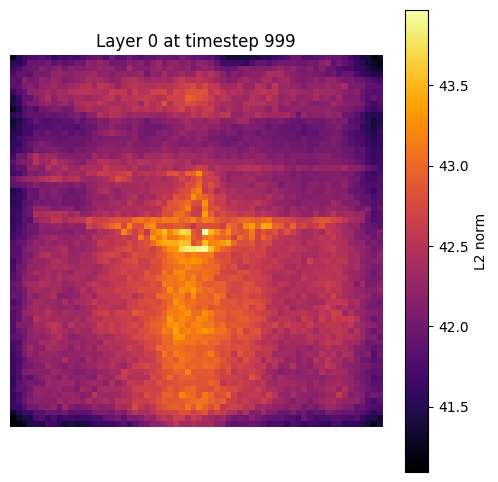

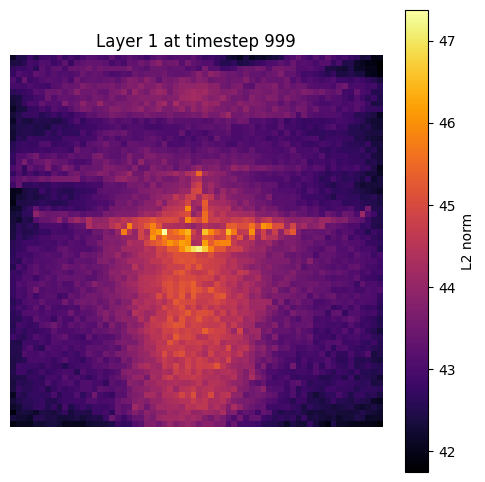

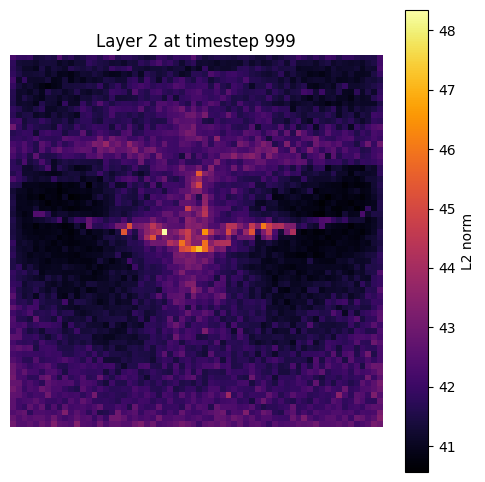

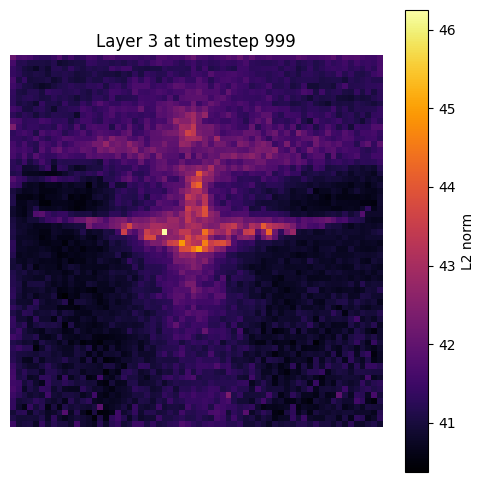

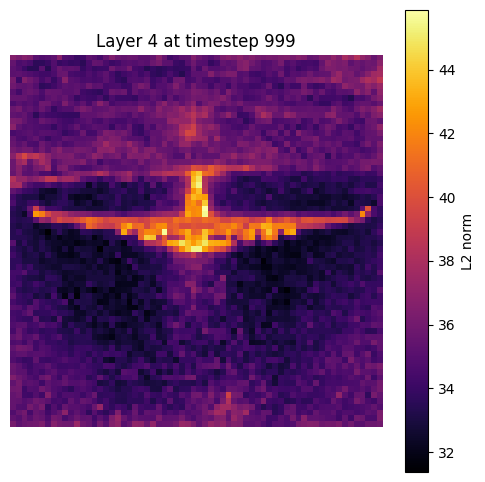

...

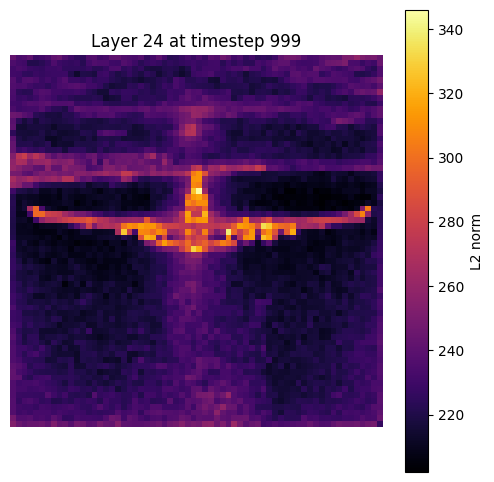

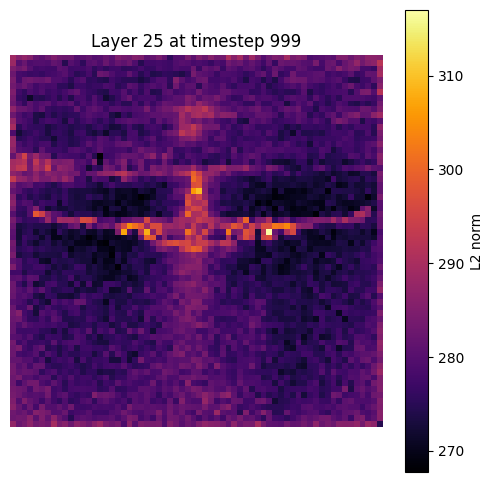

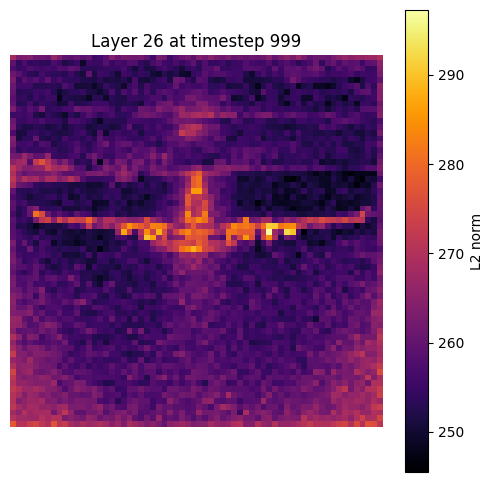

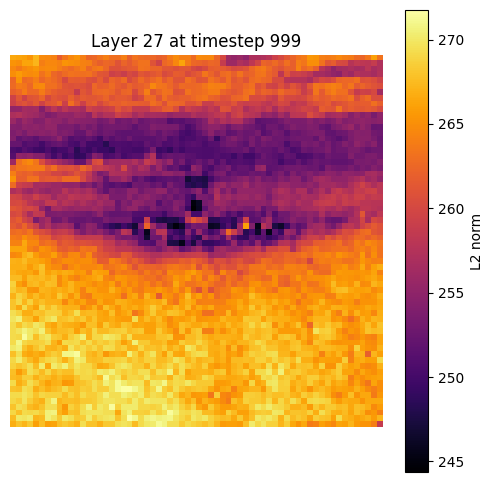

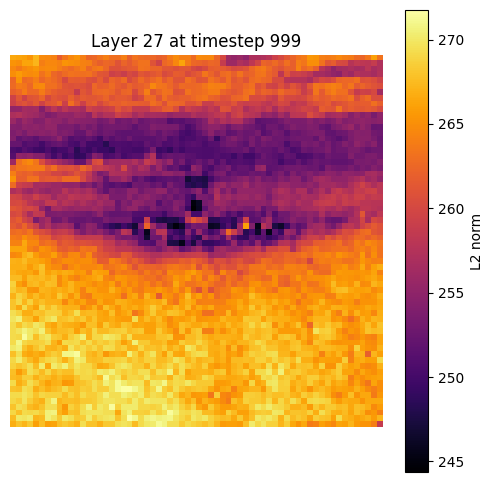

In [22]:
# Pick one layer & timestep to visualize
for layer_id in range (0, 28):
    timestep = list(layer_norms_3[layer_id].keys())[0]
    norms = layer_norms_3[layer_id][timestep]

    plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")

plot_heatmap(norms, title=f"Layer {layer_id} at timestep {timestep}")

RuntimeError: shape '[1, 2]' is invalid for input of size 8192

Error in callback <function _draw_all_if_interactive at 0x79b5b9b147c0> (for post_execute):


KeyboardInterrupt: 

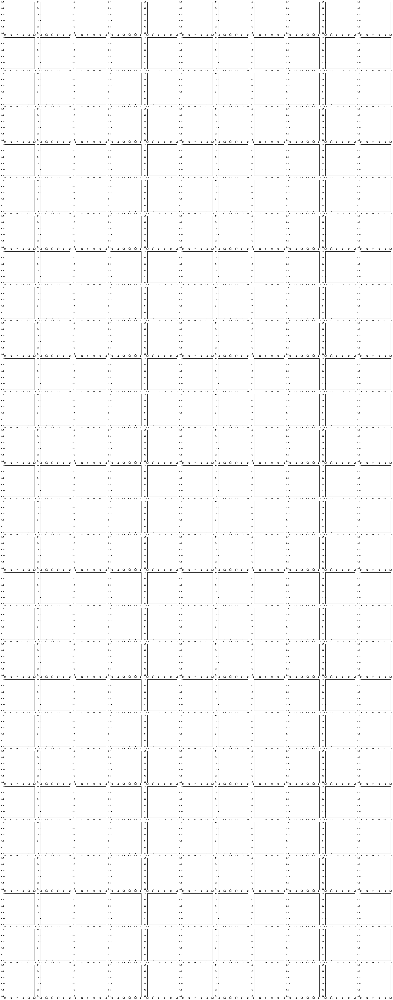

In [23]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms_3.keys())   # which layers to plot

# Determine grid size
n_rows = len(layer_ids)
n_cols = max(len(layer_norms_3[l]) for l in layer_ids)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

if n_rows == 1:
    axes = axes[None, :]   # make it 2D
if n_cols == 1:
    axes = axes[:, None]   # make it 2D

# Loop through layers and timesteps
for row_idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms_3[layer_id].keys())
    for col_idx, timestep in enumerate(timesteps):
        norms = layer_norms_3[layer_id][timestep]
        L = norms.shape[0]
        H = int(math.sqrt(L))
        W = L // H
        spatial = norms.reshape(H, W)

        ax = axes[row_idx, col_idx]
        im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
        ax.set_title(f"L{layer_id} T{timestep}", fontsize=8)
        ax.axis('off')

# Add a single colorbar for the entire figure
fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.8, label='L2 Norm')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import math

layer_ids = sorted(layer_norms_3.keys())  # layers to plot
n_layers = len(layer_ids)

# Compute grid size (rows x cols) to make it roughly square
n_cols = math.ceil(math.sqrt(n_layers))
n_rows = math.ceil(n_layers / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3),
                         constrained_layout=True)

# Flatten axes array for easy iteration
axes = axes.flatten()

for idx, layer_id in enumerate(layer_ids):
    timesteps = sorted(layer_norms_3[layer_id].keys())
    if len(timesteps) == 0:
        axes[idx].set_visible(False)
        continue
    timestep = timesteps[0]  # first timestep only

    norms = layer_norms_3[layer_id][timestep]
    L = norms.shape[0]
    H = int(math.sqrt(L))
    W = L // H
    spatial = norms.reshape(H, W)

    ax = axes[idx]
    im = ax.imshow(spatial, cmap='inferno', vmin=0, vmax=norms.max())
    ax.set_title(f"Layer {layer_id} - T{timestep}", fontsize=10)
    ax.axis('off')

# Hide any unused axes
for ax in axes[n_layers:]:
    ax.set_visible(False)

# Add a single colorbar for all heatmaps
fig.colorbar(im, ax=axes[:n_layers], shrink=0.8, label='L2 Norm')
plt.show()
